# Project Description

The Project devoted to the analyssis of the A/B Test performed in the startup that sells food products. We investigated user behavior for the company's app. First step will be the study of the sales funnel: what number of users reaches the purchase stage and how many users actually make it to this stage, how many get stuck at previous stages. Also we will investigate on which stages in particular the biggest loss of users occurs.

The second step: analyzing the results of an A/A/B test. The designers would like to change the fonts for the entire app, but the managers are afraid the users might find the new design intimidating. The decision whether implement changes or not will be made based on the results of an A/A/B test. The users are split into three groups: two control groups get the old fonts and one test group gets the new ones.

Creating two A groups has certain advantages. We can make it a principle that we will only be confident in the accuracy of our testing when the two control groups are similar. If there are significant differences between the A groups, this can help us uncover factors that may be distorting the results. Comparing control groups also tells us how much time and data we'll need when running further tests.

## Initialisation


In [1]:
# Installing libraries
! pip install -qq sidetable
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats as st
import math
import sidetable
import datetime as dt
from datetime import datetime
import scipy.stats as stats
import plotly.express as px
from plotly import graph_objects as go
import math as mth
from statsmodels.stats.proportion import proportions_ztest
import warnings

## Loading data

In [2]:
data = pd.read_csv('/datasets/logs_exp_us.csv',sep='\t')

In [3]:
# Checking general information bout DF
data.info()
data.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244126 entries, 0 to 244125
Data columns (total 4 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   EventName       244126 non-null  object
 1   DeviceIDHash    244126 non-null  int64 
 2   EventTimestamp  244126 non-null  int64 
 3   ExpId           244126 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 7.5+ MB


,EventName,DeviceIDHash,EventTimestamp,ExpId
0,MainScreenAppear,4575588528974610257,1564029816,246
1,MainScreenAppear,7416695313311560658,1564053102,246
2,PaymentScreenSuccessful,3518123091307005509,1564054127,248
3,CartScreenAppear,3518123091307005509,1564054127,248
4,PaymentScreenSuccessful,6217807653094995999,1564055322,248
5,CartScreenAppear,6217807653094995999,1564055323,248
6,OffersScreenAppear,8351860793733343758,1564066242,246
7,MainScreenAppear,5682100281902512875,1564085677,246
8,MainScreenAppear,1850981295691852772,1564086702,247
9,MainScreenAppear,5407636962369102641,1564112112,246


In [4]:
# Checking general ststistics about DF
data.describe(include='all')

,EventName,DeviceIDHash,EventTimestamp,ExpId
count,244126,2.441260e+05,2.441260e+05,244126.000000
unique,5,NaN,NaN,NaN
top,MainScreenAppear,NaN,NaN,NaN
freq,119205,NaN,NaN,NaN
mean,NaN,4.627568e+18,1.564914e+09,247.022296
std,NaN,2.642425e+18,1.771343e+05,0.824434
min,NaN,6.888747e+15,1.564030e+09,246.000000
25%,NaN,2.372212e+18,1.564757e+09,246.000000
50%,NaN,4.623192e+18,1.564919e+09,247.000000
75%,NaN,6.932517e+18,1.565075e+09,248.000000


In [5]:
# Checking missing values in DF
data.isnull().sum()

EventName         0
DeviceIDHash      0
EventTimestamp    0
ExpId             0
dtype: int64

We got the dataset of 244126 rows and 4 columns with no missing values. We need to rename columns to lower case and change data type for `Event-timestamp` column. Also we need to check that every user belongs to single group.

## Exploring and аixing original data

In [6]:
# Renaming columns
warnings.filterwarnings('ignore')
data.columns =['event_name','user_id','timestamp','group']

# Checking that everything is correct
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244126 entries, 0 to 244125
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   event_name  244126 non-null  object
 1   user_id     244126 non-null  int64 
 2   timestamp   244126 non-null  int64 
 3   group       244126 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 7.5+ MB


In [7]:
# Creating the column with datetime format
data['date']=pd.to_datetime(data['timestamp'], unit='s')

In [8]:
# Checking general information and DF sample
data.info()
print()
print(data['date'].describe())
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244126 entries, 0 to 244125
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   event_name  244126 non-null  object        
 1   user_id     244126 non-null  int64         
 2   timestamp   244126 non-null  int64         
 3   group       244126 non-null  int64         
 4   date        244126 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 9.3+ MB

count                  244126
unique                 176654
top       2019-08-04 16:23:19
freq                        9
first     2019-07-25 04:43:36
last      2019-08-07 21:15:17
Name: date, dtype: object


,event_name,user_id,timestamp,group,date
0,MainScreenAppear,4575588528974610257,1564029816,246,2019-07-25 04:43:36
1,MainScreenAppear,7416695313311560658,1564053102,246,2019-07-25 11:11:42
2,PaymentScreenSuccessful,3518123091307005509,1564054127,248,2019-07-25 11:28:47
3,CartScreenAppear,3518123091307005509,1564054127,248,2019-07-25 11:28:47
4,PaymentScreenSuccessful,6217807653094995999,1564055322,248,2019-07-25 11:48:42


In [9]:
# Checking DF for duplicates
print('Number of duplicated wntries in the DF: ', data.duplicated().sum())

# Checking the duplicated DF sample
display(data[data.duplicated(keep='last')])

Number of duplicated wntries in the DF:  413


,event_name,user_id,timestamp,group,date
452,MainScreenAppear,5613408041324010552,1564474784,248,2019-07-30 08:19:44
2348,CartScreenAppear,1694940645335807244,1564609899,248,2019-07-31 21:51:39
3572,MainScreenAppear,434103746454591587,1564628377,248,2019-08-01 02:59:37
4075,MainScreenAppear,3761373764179762633,1564631266,247,2019-08-01 03:47:46
4801,MainScreenAppear,2835328739789306622,1564634641,248,2019-08-01 04:44:01
...,...,...,...,...,...
242328,MainScreenAppear,8870358373313968633,1565206004,247,2019-08-07 19:26:44
242331,PaymentScreenSuccessful,4718002964983105693,1565206005,247,2019-08-07 19:26:45
242358,CartScreenAppear,2382591782303281935,1565206049,246,2019-08-07 19:27:29
242359,PaymentScreenSuccessful,2382591782303281935,1565206049,246,2019-08-07 19:27:29


In [10]:
# Checking for the duplicates in different columns
for i in data[data.duplicated()].columns:
    print('column', i,':', data[data.duplicated()][i].nunique(), 'duplicated entries')
print(data[data.duplicated()]['date'].unique())

column event_name : 5 duplicated entries
column user_id : 237 duplicated entries
column timestamp : 352 duplicated entries
column group : 3 duplicated entries
column date : 352 duplicated entries
['2019-07-30T08:19:44.000000000' '2019-07-31T21:51:39.000000000'
 '2019-08-01T02:59:37.000000000' '2019-08-01T03:47:46.000000000'
 '2019-08-01T04:44:01.000000000' '2019-08-01T05:36:04.000000000'
 '2019-08-01T05:47:32.000000000' '2019-08-01T06:44:06.000000000'
 '2019-08-01T07:18:49.000000000' '2019-08-01T07:54:47.000000000'
 '2019-08-01T07:58:03.000000000' '2019-08-01T08:20:27.000000000'
 '2019-08-01T09:35:39.000000000' '2019-08-01T09:53:44.000000000'
 '2019-08-01T10:30:27.000000000' '2019-08-01T11:01:10.000000000'
 '2019-08-01T11:13:21.000000000' '2019-08-01T11:13:23.000000000'
 '2019-08-01T11:40:14.000000000' '2019-08-01T11:59:10.000000000'
 '2019-08-01T12:03:03.000000000' '2019-08-01T12:42:03.000000000'
 '2019-08-01T13:20:38.000000000' '2019-08-01T13:20:39.000000000'
 '2019-08-01T13:20:40.00

The duplicates were found for all groups and events and for different dates. We have to report this issues to the technical stuff since they might be caused by problems on the technical or server side. As long as the total amount of duplicated entries is less than 1% we can dropp them off. This will not affect our future analyses.

In [11]:
# Dropping off duplicates
data_raw = data  # Saving the original DF

# Removing duplicates
data=data.drop_duplicates()

# Checking that everything is correct
data.info()
print(f'We lost {((len(data_raw)-len(data))/len(data_raw)):.2%} of the original data')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 243713 entries, 0 to 244125
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   event_name  243713 non-null  object        
 1   user_id     243713 non-null  int64         
 2   timestamp   243713 non-null  int64         
 3   group       243713 non-null  int64         
 4   date        243713 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 11.2+ MB
We lost 0.17% of the original data


**We finally got dataset of 243713 rows ready for the further analysis, which is 99.83% of the original dataset.** 

## Analayzing data

### Number of events in the log

In [12]:
# Checking for a number of events
event_list = data['event_name'].unique().tolist()
display(event_list)

['MainScreenAppear',
 'PaymentScreenSuccessful',
 'CartScreenAppear',
 'OffersScreenAppear',
 'Tutorial']

There are five events in the `event_name` colums, which represent five consecutive steps of the user: `MainScreenAppear`, `OffersScreenAppear`, `CartScreenAppear`, `PaymentScreenSuccessful` and `Tutorial`.

### Number of users in the log.

In [13]:
# Calculating the number of users
print('Number of unique users in the dataset: ', len(data['user_id'].unique()))

Number of unique users in the dataset:  7551


### Determining whether visitors belong to single group

In [14]:
# Checking that every user belongs to one unique group 
print('Number of users, which belongs to more, than one group: ',len(
    data.groupby('user_id')['group'].nunique().reset_index().query('group > 1')))

Number of users, which belongs to more, than one group:  0


There is no intersection between groups. Each `user_id` belongs to one `group` only.

### Average number of events per user

In [15]:
# Calculating average amount of events per user
print('Average amount of events per user: ', data.groupby('user_id')['event_name'].count().mean().round(2))
print('Median amount of events per user: ', data.groupby('user_id')['event_name'].count().median())


Average amount of events per user:  32.28
Median amount of events per user:  20.0


The average (32.28) is much greater then median (20), the distribution is left-skewed.  

### Time range in the log.

In [16]:
# Checking the general statistics
data['date'].describe()

count                  243713
unique                 176654
top       2019-08-01 14:40:35
freq                        9
first     2019-07-25 04:43:36
last      2019-08-07 21:15:17
Name: date, dtype: object

The dataset covers the period of 14 days from June 25th till August 7th, 2019. We gonna check the distribution of events in this period.

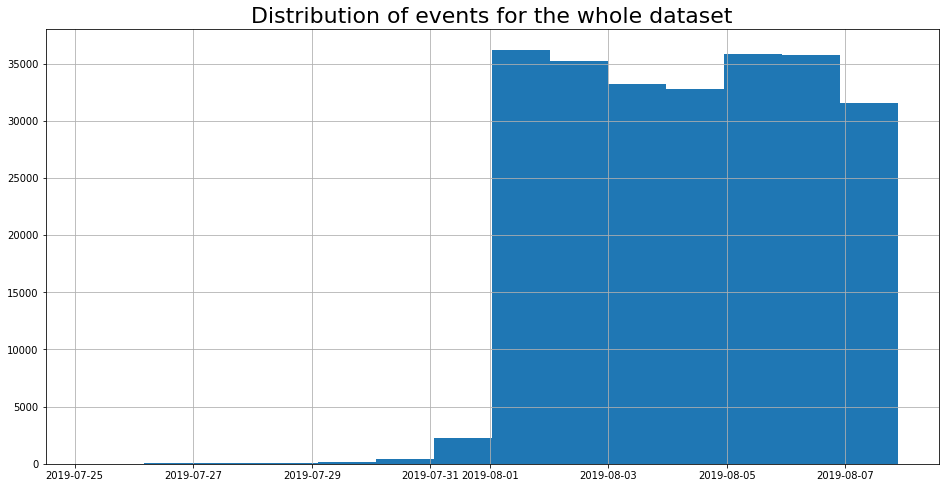

In [17]:
# Plotting the histogram
data['date'].hist(bins=14, figsize=(16,8))
plt.title('Distribution of events for the whole dataset', size=22)
plt.show()

In [18]:
# Plotting the histogram with Plotly
fig = px.histogram(data, x="timestamp")
fig.update_layout(title='Distribution of events for the whole dataset')
fig.show()

In [19]:
# Calculating ditribution of data between groups
data_july = data.query('date < "2019-08-01"')['group'].value_counts().reset_index()  # July data
data_july['pct'] = data_july['group']/data_july['group'].sum()
display(data_july)
data_august = data.query('date >= "2019-08-01"')['group'].value_counts().reset_index()  # August data
data_august['pct'] = data_august['group']/data_august['group'].sum()
display(data_august)

,index,group,pct
0,248,1019,0.360580
1,247,928,0.328379
2,246,879,0.311040


,index,group,pct
0,248,84563,0.351048
1,246,79302,0.329208
2,247,77022,0.319743


The histograms tell us that the majority of data are distributed between Auqust 1st and August 7th. Regarding data before August 1st we can that the proportion of groups is slightly different from August dataset. We may assume that due to some technical reason not all logs from July were included into dataset. 

### Calculating events in the earlier section  

In [20]:
# Checking the number of users, groups and events in the 
print('Users from the following groups in the data before August 1st: ', 
      data.query('date < "2019-08-01"')['group'].unique())
print('Number of unique users in the data before August 1st: ', 
      data.query('date < "2019-08-01"')['user_id'].nunique())
print('Total number of events in the data before August 1st: ', 
      data.query('date < "2019-08-01"')['event_name'].count())
print('Distribution of evente in the data before August 1st:')
data.query('date < "2019-08-01"')['event_name'].value_counts()

Users from the following groups in the data before August 1st:  [246 248 247]
Number of unique users in the data before August 1st:  1451
Total number of events in the data before August 1st:  2826
Distribution of evente in the data before August 1st:


MainScreenAppear           1773
OffersScreenAppear          475
CartScreenAppear            365
PaymentScreenSuccessful     200
Tutorial                     13
Name: event_name, dtype: int64

The section with data for events before August 1st contained 1451 unique users from all three experimental groups and 2826 events in total distributed in the form of classic funnel. This might be a kind of technical issue from the previous tests. 

In [21]:
# Filtering the dataset for the test result analyses
data_test = data.query('date >= "2019-08-01"')
print('Users from the following groups in the filtered DF: ', data_test['group'].unique())
print('Number ou unique users in the filtered DF: ', data_test['user_id'].nunique())
print(f'We lost {((len(data_raw)-len(data_test))/len(data_raw)):.2%} of the original data')

Users from the following groups in the filtered DF:  [246 247 248]
Number ou unique users in the filtered DF:  7534
We lost 1.33% of the original data


After filtering data we lost just 1.33% of the data in the original dataset.

## Studying the event funnel

### What events are the most frequent in the dataset.

In [22]:
# Calculating the most frequently occured events
data_test['event_name'].value_counts()

MainScreenAppear           117328
OffersScreenAppear          46333
CartScreenAppear            42303
PaymentScreenSuccessful     33918
Tutorial                     1005
Name: event_name, dtype: int64

The frequency of the events reflects the common path of the user on the website - from Main (117328) to Payment Success page (33918) page.

### How many users performed each of the actions.  

In [23]:
# Calculating the events funnel for unique users
events_funnel_nun = data_test.query('event_name !="Tutorial"').groupby(
    ['event_name'])['user_id'].nunique().sort_values(
    ascending=False).reset_index()
events_funnel_nun['pct'] = (events_funnel_nun['user_id']/data_test['user_id'].nunique()*100).round(2)
display(events_funnel_nun)

,event_name,user_id,pct
0,MainScreenAppear,7419,98.47
1,OffersScreenAppear,4593,60.96
2,CartScreenAppear,3734,49.56
3,PaymentScreenSuccessful,3539,46.97


The share of users on each step shows us the classic events funnel from  98.47% to 46.97% to unique users in the dataset.

### Finding the share of users that proceed from each stage to the next. 

In [24]:
# Plotting the funnel for unique users
fig = go.Figure()

fig.add_trace(go.Funnel(
    name = '246',
    y = events_funnel_nun['event_name'].unique(),
    x = events_funnel_nun['user_id'],
    textinfo = "value+percent previous"))

fig.update_layout(title='Events funnel for unique users with percentage for previous event')
fig.show()

About 61% of all users and 38% of unique users do not proceed to second event `OffersScreenAppear` after visiting the Main page. This is the biggest users loss in the funnel. The next two steps demonstrate much less loss of users: 95% of all users, that have placed products to their shopping Carts use pay for them.

### Finding the stage where the store lose the most users. 

In [25]:
funnel_by_group_all = data_test.groupby(['event_name', 'group'])['user_id'].nunique().sort_values(
                        ascending=False).reset_index()
funnel_by_group_conv = data_test.query('event_name != "Tutorial"').groupby(
                        ['event_name', 'group'])['user_id'].nunique().sort_values(
                        ascending=False).reset_index()
display(funnel_by_group_conv)


,event_name,group,user_id
0,MainScreenAppear,248,2493
1,MainScreenAppear,247,2476
2,MainScreenAppear,246,2450
3,OffersScreenAppear,246,1542
4,OffersScreenAppear,248,1531
5,OffersScreenAppear,247,1520
6,CartScreenAppear,246,1266
7,CartScreenAppear,247,1238
8,CartScreenAppear,248,1230
9,PaymentScreenSuccessful,246,1200


In [26]:
# Plotting the combined events funnel for 3 groups
fig = go.Figure()

fig.add_trace(go.Funnel(
    name = '246',
    y = funnel_by_group_conv['event_name'].unique(),
    x = funnel_by_group_conv.query('group == 246')['user_id'],
    textinfo = "value+percent previous"))

fig.add_trace(go.Funnel(
    name = '247',
    orientation = "h",
    y = funnel_by_group_conv['event_name'].unique(),
    x = funnel_by_group_conv.query('group == 247')['user_id'],
    textposition = "inside",
    textinfo = "value+percent previous"))

fig.add_trace(go.Funnel(
    name = '248',
    orientation = "h",
    y = funnel_by_group_conv['event_name'].unique(),
    x = funnel_by_group_conv.query('group == 248')['user_id'],
    textposition = "inside",
    textinfo = "value+percent previous"))
fig.update_layout(title='Events funnel with percentage for previous event')
fig.show()

The biggest loss of customers occurs on the first step: on the transition from Main screen to Offers screen (37% for A groups 246 and 39% for groups 247 and B). Then about 20% are lost on the second step: transition from Offer page to shopping Cart page. But when the customer get reached the Cart page 95% then proceed to checkout and pay for the goods in theis shopping Carts, which is a very good level.

In [27]:
data_path_t = data_test.sort_values(by=['user_id','timestamp'])
data_path_t.head(10)

,event_name,user_id,timestamp,group,date
197263,MainScreenAppear,6888746892508752,1565100394,246,2019-08-06 14:06:34
209196,MainScreenAppear,6909561520679493,1565117574,247,2019-08-06 18:52:54
209199,PaymentScreenSuccessful,6909561520679493,1565117578,247,2019-08-06 18:52:58
209200,CartScreenAppear,6909561520679493,1565117578,247,2019-08-06 18:52:58
209201,MainScreenAppear,6909561520679493,1565117578,247,2019-08-06 18:52:58
209210,OffersScreenAppear,6909561520679493,1565117584,247,2019-08-06 18:53:04
127670,MainScreenAppear,6922444491712477,1564928373,246,2019-08-04 14:19:33
127672,PaymentScreenSuccessful,6922444491712477,1564928380,246,2019-08-04 14:19:40
127673,CartScreenAppear,6922444491712477,1564928380,246,2019-08-04 14:19:40
127674,MainScreenAppear,6922444491712477,1564928380,246,2019-08-04 14:19:40


### The share of users which make the entire journey from their first event to payment.  


In [28]:
# Defining DF without Tutorial event sorted by user_id and timestamp
data_path = data_test[data_test['event_name']!='Tutorial'].sort_values(by=['user_id','timestamp'])
data_path.head(10)

,event_name,user_id,timestamp,group,date
197263,MainScreenAppear,6888746892508752,1565100394,246,2019-08-06 14:06:34
209196,MainScreenAppear,6909561520679493,1565117574,247,2019-08-06 18:52:54
209199,PaymentScreenSuccessful,6909561520679493,1565117578,247,2019-08-06 18:52:58
209200,CartScreenAppear,6909561520679493,1565117578,247,2019-08-06 18:52:58
209201,MainScreenAppear,6909561520679493,1565117578,247,2019-08-06 18:52:58
209210,OffersScreenAppear,6909561520679493,1565117584,247,2019-08-06 18:53:04
127670,MainScreenAppear,6922444491712477,1564928373,246,2019-08-04 14:19:33
127672,PaymentScreenSuccessful,6922444491712477,1564928380,246,2019-08-04 14:19:40
127673,CartScreenAppear,6922444491712477,1564928380,246,2019-08-04 14:19:40
127674,MainScreenAppear,6922444491712477,1564928380,246,2019-08-04 14:19:40


In [29]:
# Defining function for calculating possible paths in the log
def sequence(user):
    user_path = data_path[data_path['user_id']==user].sort_values(by=['user_id','timestamp'])
    return user_path['event_name'].drop_duplicates().to_list()

# Calling function
sequence_list = []
for i in data_path.user_id.unique():
    sequence_list.append([i,sequence(i)])

# Checking the result     
display(sequence_list[:5])

# Creating the DF with user paths
user_path_df = pd.DataFrame(sequence_list, columns=['user_id', 'path'])
user_path_df.head()

[[6888746892508752, ['MainScreenAppear']],
 [6909561520679493,
  ['MainScreenAppear',
   'PaymentScreenSuccessful',
   'CartScreenAppear',
   'OffersScreenAppear']],
 [6922444491712477,
  ['MainScreenAppear',
   'PaymentScreenSuccessful',
   'CartScreenAppear',
   'OffersScreenAppear']],
 [7435777799948366, ['MainScreenAppear']],
 [7702139951469979,
  ['MainScreenAppear',
   'OffersScreenAppear',
   'CartScreenAppear',
   'PaymentScreenSuccessful']]]

,user_id,path
0,6888746892508752,[MainScreenAppear]
1,6909561520679493,"[MainScreenAppear, PaymentScreenSuccessful, Ca..."
2,6922444491712477,"[MainScreenAppear, PaymentScreenSuccessful, Ca..."
3,7435777799948366,[MainScreenAppear]
4,7702139951469979,"[MainScreenAppear, OffersScreenAppear, CartScr..."


In [30]:
# Calculating the most common paths
pd.set_option('max_colwidth', 120)
paths = user_path_df['path'].value_counts().reset_index()
paths['pct'] = (paths['path']/paths['path'].sum()*100).round(2)
display(paths)

,index,path,pct
0,[MainScreenAppear],2882,38.27
1,"[MainScreenAppear, OffersScreenAppear, CartScreenAppear, PaymentScreenSuccessful]",905,12.02
2,"[MainScreenAppear, OffersScreenAppear]",872,11.58
3,"[MainScreenAppear, OffersScreenAppear, PaymentScreenSuccessful, CartScreenAppear]",771,10.24
4,"[MainScreenAppear, PaymentScreenSuccessful, CartScreenAppear, OffersScreenAppear]",668,8.87
5,"[MainScreenAppear, CartScreenAppear, PaymentScreenSuccessful, OffersScreenAppear]",510,6.77
6,"[MainScreenAppear, CartScreenAppear, OffersScreenAppear, PaymentScreenSuccessful]",259,3.44
7,"[MainScreenAppear, OffersScreenAppear, CartScreenAppear]",92,1.22
8,"[OffersScreenAppear, MainScreenAppear, PaymentScreenSuccessful, CartScreenAppear]",65,0.86
9,"[OffersScreenAppear, PaymentScreenSuccessful, CartScreenAppear, MainScreenAppear]",63,0.84


The most common action in the log is just visiting the Main page (38.27%). But the second most frequent sequence of actions is the **the whole path from the Main page to Payment Succeful page (12.02%)**. The third popular sequence does not relate to payments as well as the first one - Main page + Offers page (11.58%).  

On average 48% of the all initial users in all three groups use to make the whole jorney from Main page to Succesful Payment page. This share is a little bit less for the test group 248 (group B of A/B Test) for every event, than for both control groups 246 and 247 (groups A/A).

### Minimum path time

Although we do not have the ids for each unique path for each visit to the store it would be interesting to calculate the minimum time from Main page to Payment Success page. 

In [31]:
# Calculating pivot table for the minimum time
path_time = pd.pivot_table(
                            data_test[data_test['event_name'] != 'Tutorial'], 
                            index=['user_id'], 
                            columns=['event_name'], 
                            values=['date'], 
                            aggfunc = 'min')['date'].reset_index() 

# Adding column with minimum time
path_time['time'] = path_time['PaymentScreenSuccessful'] - path_time['MainScreenAppear']

# Checking the resul
display(path_time.head(10))

event_name,user_id,CartScreenAppear,MainScreenAppear,OffersScreenAppear,PaymentScreenSuccessful,time
0,6888746892508752,NaT,2019-08-06 14:06:34,NaT,NaT,NaT
1,6909561520679493,2019-08-06 18:52:58,2019-08-06 18:52:54,2019-08-06 18:53:04,2019-08-06 18:52:58,0 days 00:00:04
2,6922444491712477,2019-08-04 14:19:40,2019-08-04 14:19:33,2019-08-04 14:19:46,2019-08-04 14:19:40,0 days 00:00:07
3,7435777799948366,NaT,2019-08-05 08:06:34,NaT,NaT,NaT
4,7702139951469979,2019-08-02 14:28:45,2019-08-01 04:29:54,2019-08-01 04:29:56,2019-08-02 14:28:45,1 days 09:58:51
5,8486814028069281,2019-08-05 04:49:18,2019-08-05 04:52:40,2019-08-05 04:49:13,NaT,NaT
6,8740973466195562,NaT,2019-08-02 09:16:48,2019-08-02 09:43:59,NaT,NaT
7,9841258664663090,2019-08-03 10:52:15,2019-08-03 10:47:59,2019-08-03 10:49:42,2019-08-03 17:57:27,0 days 07:09:28
8,12692216027168046,NaT,2019-08-02 16:28:49,2019-08-05 04:06:02,NaT,NaT
9,15708180189885246,2019-08-01 11:06:19,2019-08-01 16:08:23,2019-08-01 05:38:55,2019-08-01 11:06:19,-1 days +18:57:56


In [32]:
# Checking for the most common times from Main page to Payment Success page
path_time['time'].value_counts().reset_index().head(10)

,index,time
0,0 days 00:00:02,145
1,0 days 00:00:03,144
2,0 days 00:00:04,134
3,0 days 00:00:05,107
4,0 days 00:00:06,82
5,0 days 00:00:07,70
6,0 days 00:00:01,62
7,0 days 00:00:08,50
8,0 days 00:00:10,39
9,0 days 00:00:11,36


The minimum path time from Main Page to Payment Success page in the log equals to 2 seconds. The shortest times do not refer to the entire path of four consecutive steps (ususaly only 2 steps: `MainPageScreen` and `PaymentSuccessScreen`) and may be like a kind of returning visits to the store when the products have been already preselected and put into the shopping Cart.  

## Studying the results of the experiment

### How many users are there in each group?

In [33]:
# Calculating dataframes for each group
groups = data_test.groupby('group')['user_id'].nunique().reset_index()
display(groups)

,group,user_id
0,246,2484
1,247,2513
2,248,2537


### Checking if there is a statistically significant difference between samples 246 and 247 (A/A groups).

In [34]:
# Calculating the pivot table for each event and each group
funnel_pivot = data_test.pivot_table(
                                    index='event_name', 
                                    columns='group', 
                                    values='user_id', 
                                    aggfunc='nunique').reset_index().sort_values(
                                                                                by=248, 
                                                                                ascending=False)
display(funnel_pivot)

group,event_name,246,247,248
1,MainScreenAppear,2450,2476,2493
2,OffersScreenAppear,1542,1520,1531
0,CartScreenAppear,1266,1238,1230
3,PaymentScreenSuccessful,1200,1158,1181
4,Tutorial,278,283,279


**HO**: There is no statistically significant difference in conversion of test groups 246 and 247 for different events.   
**H1**: The groups 246 and 247 are different in conversion for different events.

In [35]:
# Defining function to test null hypothesys
 
def samples_check(group1, group2, event, alpha=0.05):
    success1 = funnel_pivot[funnel_pivot.event_name==event][group1].iloc[0]
    success2 = funnel_pivot[funnel_pivot.event_name==event][group2].iloc[0]
    
    trials1 = data_test[data_test.group==group1]['user_id'].nunique()
    trials2 = data_test[data_test.group==group2]['user_id'].nunique()
    
    # success proportion in the first group:
    p1 = success1/trials1
#    print('p1:', p1)

    # success proportion in the second group:
    p2 = success2/trials2
#    print('p2:', p2)

    # success proportion in the combined dataset:
    p_combined = (success1 + success2) / (trials1 + trials2)
#    print('p_combined: ', p_combined)

    # the difference between the datasets' proportions
    difference = p1 - p2
#    print('difference: ', difference)
    
    # calculating the statistic in standard deviations of the standard normal distribution
    z_value = difference / mth.sqrt(p_combined * (1 - p_combined) * (1/trials1 + 1/trials2))
 #   print('z_value: ', z_value)

    # setting up the standard normal distribution (mean 0, standard deviation 1)
    distr = st.norm(0, 1)
 #   print('distr: ', distr)
    
    # calculating the statistic in standard deviations of the standard normal distribution
    p_value = (1 - distr.cdf(abs(z_value))) * 2

    print('p-value: ', p_value)

    if (p_value < alpha):
        print(f'Rejecting the null hypothesis for {event} and groups {group1} and {group2}')
    else:
        print(f'Failed to reject the null hypothesis for {event} and groups {group1} and {group2}')
    

In [36]:
for i in funnel_pivot.event_name.unique():
    samples_check(246,247,i,alpha=0.05)
    print('-----------------------------')

p-value:  0.7570597232046099
Failed to reject the null hypothesis for MainScreenAppear and groups 246 and 247
-----------------------------
p-value:  0.2480954578522181
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 and 247
-----------------------------
p-value:  0.22883372237997213
Failed to reject the null hypothesis for CartScreenAppear and groups 246 and 247
-----------------------------
p-value:  0.11456679313141849
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 and 247
-----------------------------
p-value:  0.9376996189257114
Failed to reject the null hypothesis for Tutorial and groups 246 and 247
-----------------------------


We have no reason to reject the null hypothesis for every event, which means that therу is no statisticaly significant difference between conversion aka proportion in two A/A groups: 246 and 247.

### Checking that  A/A  groups have been split properly.

In [37]:
# Calculating the most popular events
main_page = data_test.groupby('event_name')['user_id'].nunique().reset_index().sort_values(
                                                                                            by='user_id', 
                                                                                            ascending=False)
display(main_page)

,event_name,user_id
1,MainScreenAppear,7419
2,OffersScreenAppear,4593
0,CartScreenAppear,3734
3,PaymentScreenSuccessful,3539
4,Tutorial,840


In [38]:
# Calculatihg the number of users who performed 'MainScreenAppear' in each group
main_page_by_group  = data_test.query('event_name == "MainScreenAppear"').groupby(
    'group')['user_id'].nunique().reset_index()
main_page_by_group.columns = ['group', 'main_page_id']
main_page_by_group = main_page_by_group.merge(groups, on='group')
main_page_by_group['pct'] = ((main_page_by_group['main_page_id'] / 
                              main_page_by_group['user_id'])*100).round(2)
main_page_by_group

,group,main_page_id,user_id,pct
0,246,2450,2484,98.63
1,247,2476,2513,98.53
2,248,2493,2537,98.27


In all three groups share of users performed the most popular step `MaimScreenAppear` is practically the same. Let's check the share of users on other steps.

In [39]:
# Defining function for calculating proportions per each event
def hypothesis_check(group1, group2, event): #, alpha=0.05):
    success1=funnel_pivot[funnel_pivot.event_name==event][group1].iloc[0]
    success2=funnel_pivot[funnel_pivot.event_name==event][group2].iloc[0]
    
    trials1=data_test[data_test.group==group1]['user_id'].nunique()
    trials2=data_test[data_test.group==group2]['user_id'].nunique()
   
    p_value=proportions_ztest([success1,success2], [trials1,trials2])[1]

    print('Proportion of',group1,':',success1/trials1)
    print('Proportion of',group2,':',success2/trials2)
    print('p-value: ', p_value)

    if (p_value < alpha):
        print("Rejecting the null hypothesis for", event,"and groups", group1,group2)
    else:
        print("Failed to reject the null hypothesis for",event,"and groups", group1,group2 )

In [40]:
# Checking the hypothesys 
alpha = 0.05
for i in funnel_pivot.event_name.unique():
    hypothesis_check(246, 247, i) #, alpha=0.05)
    print('-----------------------------')

Proportion of 246 : 0.9863123993558777
Proportion of 247 : 0.9852765618782332
p-value:  0.7570597232046099
Failed to reject the null hypothesis for MainScreenAppear and groups 246 247
-----------------------------
Proportion of 246 : 0.6207729468599034
Proportion of 247 : 0.6048547552725826
p-value:  0.2480954578522181
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 247
-----------------------------
Proportion of 246 : 0.5096618357487923
Proportion of 247 : 0.4926382809391166
p-value:  0.22883372237997213
Failed to reject the null hypothesis for CartScreenAppear and groups 246 247
-----------------------------
Proportion of 246 : 0.4830917874396135
Proportion of 247 : 0.46080382013529647
p-value:  0.11456679313141847
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 247
-----------------------------
Proportion of 246 : 0.11191626409017713
Proportion of 247 : 0.11261440509351373
p-value:  0.9376996189257114
Failed to reject the nu

**Based on the the resuts of the proportion test for every event we can confirm that the control A/A groups 246 and 247 were split properly.**

### Checking the hypothesis for groups 246/247 and group 248 (A/B)

#### Checking the hypothesis for groups 246 and 248 (A/B)

Now we can formulate the null and alternative hypothesis for A/B test: groups 246 and 248:   
**HO**: There is no statistically significant difference in conversion of test groups 246 and 248 for different events.   
**H1**: The groups 246 and 248 are different in conversion for different events.

In [41]:
# Checking the hypothesys for groups 246 and 248 (A/B Test)
for i in funnel_pivot.event_name.unique():
    hypothesis_check(246, 248, i) #, alpha=0.05)
    print('-----------------------------')

Proportion of 246 : 0.9863123993558777
Proportion of 248 : 0.9826566811194324
p-value:  0.2949721933554553
Failed to reject the null hypothesis for MainScreenAppear and groups 246 248
-----------------------------
Proportion of 246 : 0.6207729468599034
Proportion of 248 : 0.6034686637761135
p-value:  0.20836205402738917
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 248
-----------------------------
Proportion of 246 : 0.5096618357487923
Proportion of 248 : 0.48482459597950334
p-value:  0.07842923237520125
Failed to reject the null hypothesis for CartScreenAppear and groups 246 248
-----------------------------
Proportion of 246 : 0.4830917874396135
Proportion of 248 : 0.46551044540796216
p-value:  0.21225532756977972
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 248
-----------------------------
Proportion of 246 : 0.11191626409017713
Proportion of 248 : 0.10997240835632636
p-value:  0.8264294010087645
Failed to reject the 

#### Checking the hypothesis for groups 247 and 248 (A/B)

The null and alternative hypothesis for A/B test: groups 247 and 248 are as follows:  
**HO**: There is no statistically significant difference in conversion of test groups 247 and 248 for different events.  
**H1**: The groups 247 and 248 are different in conversion for different events.

In [42]:
# Checking the hypothesys for groups 247 and 248 (A/B Test)
for i in funnel_pivot.event_name.unique():
    hypothesis_check(247, 248, i) #, alpha=0.05)
    print('-----------------------------')

Proportion of 247 : 0.9852765618782332
Proportion of 248 : 0.9826566811194324
p-value:  0.45870536166215137
Failed to reject the null hypothesis for MainScreenAppear and groups 247 248
-----------------------------
Proportion of 247 : 0.6048547552725826
Proportion of 248 : 0.6034686637761135
p-value:  0.919781783059226
Failed to reject the null hypothesis for OffersScreenAppear and groups 247 248
-----------------------------
Proportion of 247 : 0.4926382809391166
Proportion of 248 : 0.48482459597950334
p-value:  0.5786197879539782
Failed to reject the null hypothesis for CartScreenAppear and groups 247 248
-----------------------------
Proportion of 247 : 0.46080382013529647
Proportion of 248 : 0.46551044540796216
p-value:  0.7373415053803964
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 247 248
-----------------------------
Proportion of 247 : 0.11261440509351373
Proportion of 248 : 0.10997240835632636
p-value:  0.7653239224745011
Failed to reject the nu

#### Checking the hypothesis for combined groups 246 and 247 and group 248 (A/B)

Now we will check the null hypothesis for the A/B test for combined A/A groups (246 and 247) and group 248:    
**HO**: There is no statistically significant difference in conversion of combined test groups 246 and 247 and group 248 for different events.  
**H1**: The combined groups 246 and 247 and group 248 are different in conversion for different events.

In [43]:
# Checking the hypothesys for combined groups 246 and 247 and group 248 (A/B Test)
def hypothesis_check_AAB(group1, group2, group3, event):
    success1 = funnel_pivot[funnel_pivot.event_name == event][group1].iloc[0]
    success2 = funnel_pivot[funnel_pivot.event_name == event][group2].iloc[0]
    success_combined = success1 + success2   
    success3 = funnel_pivot[funnel_pivot.event_name == event][group3].iloc[0]
    
    trials1 = data_test[data_test.group==group1]['user_id'].nunique()
    trials2 = data_test[data_test.group==group2]['user_id'].nunique()
    trials_combined = trials1 + trials2
    trials3 = data_test[data_test.group==group3]['user_id'].nunique()
   
    p_value = proportions_ztest([success_combined,success3], [trials_combined,trials3])[1]

    print('Proportion of', group1,"+",group2,":",success_combined/trials_combined)
    print('Proportion of',group3,":",success3/trials3)
    print('p-value: ', p_value)

    if (p_value < alpha):
        print("Rejecting the null hypothesis for", event,"and groups", group1,"+",group2, group3)
    else:
        print("Failed to reject the null hypothesis for",event,"and groups", group1,"+",group2, group3)

In [44]:
# Checking the hypothesys for combined groups 246 and 247 and 248 (A/B test)
for i in funnel_pivot.event_name.unique():
    hypothesis_check_AAB(246, 247, 248, i) #, alpha=0.05)
    print('-----------------------------')

Proportion of 246 + 247 : 0.9857914748849309
Proportion of 248 : 0.9826566811194324
p-value:  0.29424526837179577
Failed to reject the null hypothesis for MainScreenAppear and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.6127676605963578
Proportion of 248 : 0.6034686637761135
p-value:  0.43425549655188245
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.5011006603962378
Proportion of 248 : 0.48482459597950334
p-value:  0.18175875284404386
Failed to reject the null hypothesis for CartScreenAppear and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.47188312987792674
Proportion of 248 : 0.46551044540796216
p-value:  0.6004294282308703
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.11226736041624975
Proportion of 248 : 0.1099724083563

Based on the combined test results of control groups 246 and 247 (A/A) and group 248 (B) we can confirm that there is no statistical significance between combined control groups result and group 248 on every step. 

### Checking the hypothesis for alternative level of statistical significance level equals to 10%.

In [45]:
# Checking the hypothesys for groups 246 and 248 (A and B)
# Setting statistical significance level
alpha = 0.1
for i in funnel_pivot.event_name.unique():
    hypothesis_check(246,248,i) 
    print('-----------------------------')

Proportion of 246 : 0.9863123993558777
Proportion of 248 : 0.9826566811194324
p-value:  0.2949721933554553
Failed to reject the null hypothesis for MainScreenAppear and groups 246 248
-----------------------------
Proportion of 246 : 0.6207729468599034
Proportion of 248 : 0.6034686637761135
p-value:  0.20836205402738917
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 248
-----------------------------
Proportion of 246 : 0.5096618357487923
Proportion of 248 : 0.48482459597950334
p-value:  0.07842923237520125
Rejecting the null hypothesis for CartScreenAppear and groups 246 248
-----------------------------
Proportion of 246 : 0.4830917874396135
Proportion of 248 : 0.46551044540796216
p-value:  0.21225532756977972
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 248
-----------------------------
Proportion of 246 : 0.11191626409017713
Proportion of 248 : 0.10997240835632636
p-value:  0.8264294010087645
Failed to reject the null hy

We reject the null hypothesis for the event `CartScreen Appear`: the conversion rate for the groups 246 and 248 is different.  
For all other event we got the same result as in previous test (with alpha=0.05): we have no reason to reject the null hypothesis. 

In [46]:
# Checking the hypothesys for groups 246 and 248 (A/B Test)
for i in funnel_pivot.event_name.unique():
    hypothesis_check(247, 248, i)
    print('-----------------------------')

Proportion of 247 : 0.9852765618782332
Proportion of 248 : 0.9826566811194324
p-value:  0.45870536166215137
Failed to reject the null hypothesis for MainScreenAppear and groups 247 248
-----------------------------
Proportion of 247 : 0.6048547552725826
Proportion of 248 : 0.6034686637761135
p-value:  0.919781783059226
Failed to reject the null hypothesis for OffersScreenAppear and groups 247 248
-----------------------------
Proportion of 247 : 0.4926382809391166
Proportion of 248 : 0.48482459597950334
p-value:  0.5786197879539782
Failed to reject the null hypothesis for CartScreenAppear and groups 247 248
-----------------------------
Proportion of 247 : 0.46080382013529647
Proportion of 248 : 0.46551044540796216
p-value:  0.7373415053803964
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 247 248
-----------------------------
Proportion of 247 : 0.11261440509351373
Proportion of 248 : 0.10997240835632636
p-value:  0.7653239224745011
Failed to reject the nu

We got the same result as in previous test (with alpha=0.05): we have no reason to reject the null hypothesis. 

In [47]:
# Checking the hypothesys for groups 247 and 248 (A and B)
for i in funnel_pivot.event_name.unique():
    hypothesis_check_AAB(246, 247, 248, i) 
    print('-----------------------------')

Proportion of 246 + 247 : 0.9857914748849309
Proportion of 248 : 0.9826566811194324
p-value:  0.29424526837179577
Failed to reject the null hypothesis for MainScreenAppear and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.6127676605963578
Proportion of 248 : 0.6034686637761135
p-value:  0.43425549655188245
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.5011006603962378
Proportion of 248 : 0.48482459597950334
p-value:  0.18175875284404386
Failed to reject the null hypothesis for CartScreenAppear and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.47188312987792674
Proportion of 248 : 0.46551044540796216
p-value:  0.6004294282308703
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.11226736041624975
Proportion of 248 : 0.1099724083563

We got the same result as in previous test (with alpha=0.05): we have no reason to reject the null hypothesis.

We have performed each comparison tests 5 times per each pair of groups. To minimise family-wise error rate (FWER) we can implement the Bonferroni correction being the most conservative approach, which sets the aplha value for the entire set of comparisons equal to the division of the initial alpha value of an individual test by the number of tests performed.

In [48]:
# Defining function for calculating proportions per each event with Bonderroni correction
def hypothesis_check_bc(group1, group2, event):
    success1=funnel_pivot[funnel_pivot.event_name==event][group1].iloc[0]
    success2=funnel_pivot[funnel_pivot.event_name==event][group2].iloc[0]
    
    trials1=data_test[data_test.group==group1]['user_id'].nunique()
    trials2=data_test[data_test.group==group2]['user_id'].nunique()
   
    p_value=proportions_ztest([success1,success2], [trials1,trials2])[1]

    print('Proportion of',group1,':',success1/trials1)
    print('Proportion of',group2,':',success2/trials2)
    print('p-value: ', p_value)

    if (p_value < bonferroni_alpha):
        print("Rejecting the null hypothesis for", event,"and groups", group1,group2)
    else:
        print("Failed to reject the null hypothesis for",event,"and groups", group1,group2 )

# Cheking hypotheses with Bonferroni correction        
bonferroni_alpha = 0.05/5
print('For groups 246 and 248:')
for i in funnel_pivot.event_name.unique():
    hypothesis_check_bc(246,248,i) 
    print('-----------------------------')
print()
print('For groups 247 and 248:')
for i in funnel_pivot.event_name.unique():
    hypothesis_check_bc(247,248,i) 
    print('-----------------------------')

For groups 246 and 248:
Proportion of 246 : 0.9863123993558777
Proportion of 248 : 0.9826566811194324
p-value:  0.2949721933554553
Failed to reject the null hypothesis for MainScreenAppear and groups 246 248
-----------------------------
Proportion of 246 : 0.6207729468599034
Proportion of 248 : 0.6034686637761135
p-value:  0.20836205402738917
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 248
-----------------------------
Proportion of 246 : 0.5096618357487923
Proportion of 248 : 0.48482459597950334
p-value:  0.07842923237520125
Failed to reject the null hypothesis for CartScreenAppear and groups 246 248
-----------------------------
Proportion of 246 : 0.4830917874396135
Proportion of 248 : 0.46551044540796216
p-value:  0.21225532756977972
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 248
-----------------------------
Proportion of 246 : 0.11191626409017713
Proportion of 248 : 0.10997240835632636
p-value:  0.82642940100876

The results are the same with Bonferroni corrections: we have no reason to reject the null hypothesis, which means that there is no stsatistically significant difference for conversions for every event between both control groups 246 and 247 (A/A) and group 248 (B).  

In [49]:
# Checking the hypothesys for combined groups 246 and 247 and group 248 (A/B Test)
def hypothesis_check_AAB_bc(group1, group2, group3, event):
    success1 = funnel_pivot[funnel_pivot.event_name == event][group1].iloc[0]
    success2 = funnel_pivot[funnel_pivot.event_name == event][group2].iloc[0]
    success_combined = success1 + success2   
    success3 = funnel_pivot[funnel_pivot.event_name == event][group3].iloc[0]
    
    trials1 = data_test[data_test.group==group1]['user_id'].nunique()
    trials2 = data_test[data_test.group==group2]['user_id'].nunique()
    trials_combined = trials1 + trials2
    trials3 = data_test[data_test.group==group3]['user_id'].nunique()
   
    p_value = proportions_ztest([success_combined,success3], [trials_combined,trials3])[1]

    print('Proportion of', group1,"+",group2,":",success_combined/trials_combined)
    print('Proportion of',group3,":",success3/trials3)
    print('p-value: ', p_value)

    if (p_value < bonferroni_alpha):
        print("Rejecting the null hypothesis for", event,"and groups", group1,"+",group2, group3)
    else:
        print("Failed to reject the null hypothesis for",event,"and groups", group1,"+",group2, group3)

# Cheking hypotheses with Bonferroni correction  
bonferroni_alpha = 0.05/5
for i in funnel_pivot.event_name.unique():
    hypothesis_check_AAB_bc(246, 247, 248, i) 
    print('-----------------------------')

Proportion of 246 + 247 : 0.9857914748849309
Proportion of 248 : 0.9826566811194324
p-value:  0.29424526837179577
Failed to reject the null hypothesis for MainScreenAppear and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.6127676605963578
Proportion of 248 : 0.6034686637761135
p-value:  0.43425549655188245
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.5011006603962378
Proportion of 248 : 0.48482459597950334
p-value:  0.18175875284404386
Failed to reject the null hypothesis for CartScreenAppear and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.47188312987792674
Proportion of 248 : 0.46551044540796216
p-value:  0.6004294282308703
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 + 247 248
-----------------------------
Proportion of 246 + 247 : 0.11226736041624975
Proportion of 248 : 0.1099724083563

The results are the same with Bonferroni corrections: we have no reason to reject the null hypothesis, which means that there is no stsatistically significant difference for conversions for every event between combined results of both control groups 246 and 247 (A) and group 248 (B).  

## Conclusion

The research was made on the dataset containing log of visiting the online store. We got DF of 244126 rows and 4 columns with no missing values. We renamed columns to lower case and ctreated new `date` column with datetame data type. All users were checked for belonging to only one test group. There is no intersection between groups. Each `user_id` belongs to one `group` only.

There werу found 413 duplicated entries in the original DF. The duplicates were found for all groups and events and for different dates. We have to report this issues to the technical stuff since they might be caused by problems on the technical or server side. As long as the total amount of duplicated entries was less than 1% we have dropp them off. 

The final dataset for further analyses consisted of 243713 rows ready for the further analysis, which is 99.83% of the original dataset. 
 
After plotting histograms and the scatter plot we found out that the majority of the data were distributed between Auqust 1st and August 7th with clear botder on August 1st. We assumed that the actual test took place on August 1st-7th and data before August 1st refered to some previous tests and/or events.

The section with data for events before August 1st contained 1451 unique users from all three experimental groups and 2826 events in total distributed in the form of classic funnel. This may be some sort of technical issue with filling in screen forms from previous tests. After filtering data from earlier periods we lost just 1.33% of the data in the original dataset.  

There are five events in the `event_name` colums, which represent five consecutive steps of the user: `MainScreenAppear`, `OffersScreenAppear`, `CartScreenAppear`, `PaymentScreenSuccessful` and `Tutorial`.

There were found **7534 unique users** in the filtered dataset and five events in the `event_name` colums, which represent five consecutive steps of the user: `MainScreenAppear`, `OffersScreenAppear`, `CartScreenAppear`, `PaymentScreenSuccessful` and `Tutorial`.  
  
The frequency of the events reflects the common path of the user on the website - from Main (117328) to the Tutoral (1005) page.

On average 48% of the all initial users in all three groups use to make the whole jorney from Main page to Succesful Payment page. This share is a little bit less for the test group 248 (group B of A/B Test) for every event, than for both control groups 246 and 247 (groups A/A).
  
group	  event_name	246	    247	    248  
- MainScreenAppear	2450 / 2476 / 2493  
- OffersScreenAppear	1542 /	1520	/ 1531  
- CartScreenAppear	1266 /	1238 /	1230  
- PaymentScreenSuccessful	1200 /	1158 /	1181  
- Tutorial	278	/ 283 /	279      

The biggest loss of customers occurs on the first step: on the transition from Main screen to Offers screen (37% for A groups 246 and 39% for groups 247 and B). Then about 20% are lost on the second step: transition from Offer page to shopping Cart page. But when the customer get reached the Cart page 95% then proceed to checkout and pay for the goods in theis shopping Carts, which is a very good level.
  
The users were devided in thre groups:  
- group 246: 2484 users
- group 247: 2513 users
- group 248: 2537 users
  
We have checked the differnece between conversion aka proportion for every event and found out that there is no statisticaly significant difference between two A/A groups: 246 and 247. That means that the A/A groups have been splitted properly.  

After this we formulated and testet the folowing hypothesis for both control groups 246 and 247 (A/A) and group 248 (B) assuming the level of statistical significance equal to 5% (**alpha=0.05**):

**For groups 246 and 248:**  

**HO**: There is no statistically significant difference in conversion for every event between test group 246 and 248.  
**H1**: The groups 246 and group 248 are different in conversion for the same events.  
    
Based on the test results we can confirm that we have no reason to reject the null hypothesys, which means that there is no statistical significance between groups 246 and 248 on every step.   

**For groups 247 and 248:**  

**HO**: There is no statistically significant difference in conversion for every event between test group 247 and 248.  
**H1**: The groups 247 and group 248 are different in conversion for the same events.  
    
Based on the test results we can confirm that we have no reason to reject the null hypothesys, which means that there is no statistical significance between groups 247 and 248 on every step.     

**For combined results of groups 246 and 247 and group 248:**  

**HO**: There is no statistically significant difference in conversion for every event between combined test groups 246 and 247 and group 248.  
**H1**: The combened groups 246 and 247 and group 248 are different in conversion for the same events.  
    
Based on the test results we can confirm that we have no reason to reject the null hypothesys, which means that there is no statistical significance between groups 246 and 248 on every step.  
  
The Bonferroni correction, implemented to the statistical significance value for the multiple tests brought no difference for the results of the test: no ststistically significant difference was founf neither for that between both control groups 246 and 247 and group B, nor between combined results of groups 246 and 247 and group 248.       
    
After setting the alternative level of statistical significance equal to 10% (**alpha=0.1**) we tested all the above mentioned hypothesis and got the same results with one excemption:  
  
The null hypothesys was rejected for groups 246 and 248 for the event `CartScreen Appear`: the conversion rate for the groups 246 and 248 is different. 
The event funnel shows better results for group 246 (52%) than for group 28 (49%) for this event, which means that the new fonts for the entire app did not improve conversion. 
  
**Overall conclusion:**
Based on our analysys of the A/B Test performed from August 1st to August 7th with two properly splitted A/A groups 246 and 247 and group B (group 248) the new fonts introduced for the entire app design did not show the statistically significant differenece in conversion for group B for every event.   




  
  
  

  
  
  
  
  
  
  